# 3) Reconstruct target file with source collection frames

This is the final notebook of the Freesound AMPLAB session and contains the code that performs *audio mosaicing* to construct a new version of the target file by using audio frames chosen from the source collection. This notebook used the DataFrames generated in the previous notebooks which contain metadata about the Freesound sounds in the source collection, the analysis results of the source collection and the analysis results of the target audio file.

# 0. Import Libraries and Define Constants

In [25]:
import os
import pandas as pd
import essentia
import essentia.standard as estd
from essentia.standard import *
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from IPython.display import display, Audio

In [26]:
# Load all DataFrames created in the previous notebooks
DATASET_FILENAME_BREAK = 'dataframe_break.csv'
DATAFRAME_SOURCE_UNITS_FILENAME_BREAK = 'dataframe_source_break.csv'
DATAFRAME_TARGET_FILE_FILENAME_BREAK = 'dataframe_target_break.csv'

DATASET_FILENAME_PIANO = 'dataframe_piano.csv'
DATAFRAME_SOURCE_UNITS_FILENAME_PIANO = 'dataframe_source_piano.csv'
DATAFRAME_TARGET_FILE_FILENAME_PIANO = 'dataframe_target_piano.csv'

df_break = pd.read_csv(open(DATASET_FILENAME_BREAK), index_col=0)
df_source_break = pd.read_csv(open(DATAFRAME_SOURCE_UNITS_FILENAME_BREAK), index_col=0)
df_target_break = pd.read_csv(open(DATAFRAME_TARGET_FILE_FILENAME_BREAK), index_col=0)

df_piano = pd.read_csv(open(DATASET_FILENAME_PIANO), index_col=0)
df_source_piano = pd.read_csv(open(DATAFRAME_SOURCE_UNITS_FILENAME_PIANO), index_col=0)
df_target_piano = pd.read_csv(open(DATAFRAME_TARGET_FILE_FILENAME_PIANO), index_col=0)

In [27]:
# Define some util functions
# NOTE: remember that if you update these util functions and want to do a new audio mosaicing, you'll need
# to re-run both this cell (to update the util functions) and the cell below (which uses the util functions to
# do the audio mosaicing).

loaded_audio_files = {}
import random

def get_audio_file_segment(file_path, start_sample, n_samples):
    """Load audio file. Try to get it from memory first. If not there, open it and save in memory for next time.
    """
    if file_path not in loaded_audio_files:
        loader = estd.MonoLoader(filename=file_path)
        audio = loader()
        loaded_audio_files[file_path] = audio
    else:
        audio = loaded_audio_files[file_path]

    # Return segment
    return audio[start_sample:start_sample + n_samples]

def find_similar_frames(query_frame, df_source_frames, n, features):
    """Find the 'n' mosr similar frames for a given 'query_frame' from those in the given 'df_source_frames'.
    Similarity is computed using a nearest neighbours algorithm and taking only into account the feature list
    given in the 'features' parameter.
    """
    query_frame = query_frame.reshape(1,-1)
    nbrs = NearestNeighbors(n_neighbors=n, algorithm='ball_tree').fit(df_source_frames[features].values)
    distances, indices = nbrs.kneighbors(query_frame)
    return [df_source_frames.iloc[k] for k in indices[0]]

def chose_frame_from_source_collection(target_frame, df_source_frames, melodic):
    """Choose one frame from 'df_source_frames' to replace the 'target_frame'.
    This implementation chooses the source frame usinng a similarity algorithm 'find_similar_frames',
    and a specific set of similarity features for timbre (MFCC).
    You can modify this function to implement new ways to choose a frame from the source.
    
    NOTE: 'target_frame' here should have the same features as 'df_source_frames' because both the
    target file and the source collection have been analyzed with the same analysis function.
    You can list available features using 'print(list(target_frame.keys()))' and print(list(df_source_frames.keys()))
    """
    n_neighbours_to_find = 20
    
    if melodic: similarity_features = ['mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 
                                       'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 
                                       'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12',
                                       'attack_time', 'pitch']  
    else: similarity_features = ['mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 
                                       'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 
                                       'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12',
                                       'attack_time']  
 
    # Find the 10 most similar frames to the target_frame from df_source_framesdf_source_units 
    query_frame = target_frame[similarity_features].values
    similar_frames = find_similar_frames(query_frame, df_source_frames, n_neighbours_to_find, similarity_features)
    
    # Choose the first one as is the most similar
    most_similar_frame = similar_frames[0]
    
    return most_similar_frame

# 1. Break-beat Audio Mosaicing / Reconstruction

In [28]:
# Do the reconstruction (audio mosaicing) of the target file using audio chunks (units, frames) from the sounds in the source collection

# Load target audio file to get its total length and to use it later
target_sound_filename = df_target_break.iloc[0]['path']
target_audio = estd.MonoLoader(filename=target_sound_filename)()
total_length_target_audio = len(target_audio)

# Init array where to put the audio of the reconstructed file
generated_audio = np.zeros(total_length_target_audio)

# Init list where to store IDs of sounds used in the reconstruction
selected_freesound_ids = []

# Iterate over the analyzed frame of the target file
print('Reconstructing audio file...')
for i in range(0, len(df_target_break)):
    target_frame = df_target_break.iloc[i]  # Get current frame

    # Choose one frame from the source collection to replace the target frame
    most_similar_frame = chose_frame_from_source_collection(target_frame, df_source_break, False)

    # Store freesound ID of the original sound where the 'most_similar_frame' belongs to
    selected_freesound_ids.append(most_similar_frame['freesound_id'])

    # Get the audio segment corresponding to the 'most_similar_frame'
    target_frame_n_samples = target_frame['end_sample'] - target_frame['start_sample']
    most_similar_frame_audio = get_audio_file_segment(most_similar_frame['path'], most_similar_frame['start_sample'],  target_frame_n_samples)

    # Add audio segment to the reconstructed audio array
    generated_audio[target_frame['start_sample']:target_frame['start_sample']+len(most_similar_frame_audio)] = most_similar_frame_audio

# Store the results in a WAV file
generated_audio_filename = '{0}.reconstructed.wav'.format(target_sound_filename)
estd.MonoWriter(filename=generated_audio_filename, format='wav', sampleRate=44100)(essentia.array(generated_audio))
print('Audio generated and saved in {0}!\nIt contains audio from the following sounds:'.format(generated_audio_filename))
display(df_break.loc[df_break['freesound_id'].isin(selected_freesound_ids)])  # Show metadata for the Freesound sounds used in the reconstruction

Reconstructing audio file...
Audio generated and saved in 194817__csum__amen-break-mashed-164bpm.wav.reconstructed.wav!
It contains audio from the following sounds:


[wav @ 0x7fab92977600] Using AVStream.codec.time_base as a timebase hint to the muxer is deprecated. Set AVStream.time_base instead.


,name,username,license,tags,freesound_id,path
40,303ish c120bpm.wav,@realdavidfloat,https://creativecommons.org/licenses/by/4.0/,"['c', 'bass', '120bpm', 'house', '303', 'dance...",418611,files/418611_7052167-hq.ogg
54,Food Beats 2.wav,hello_flowers,http://creativecommons.org/publicdomain/zero/1.0/,"['beats', 'drumloop', 'drums', 'hip-hop', 'loop']",32279,files/32279_199517-hq.ogg
56,acid loop - 1 bar - 120 bpm,Liquid_Tribal,http://creativecommons.org/publicdomain/zero/1.0/,"['house', 'bpm', '120', 'techno', 'acid', 'loop']",584956,files/584956_8705222-hq.ogg
75,[Drums] Unsliced Live Claps 000,waveplaySFX,http://creativecommons.org/publicdomain/zero/1.0/,"['live', 'recording', 'recorded', 'sliced', 'r...",541279,files/541279_1676145-hq.ogg


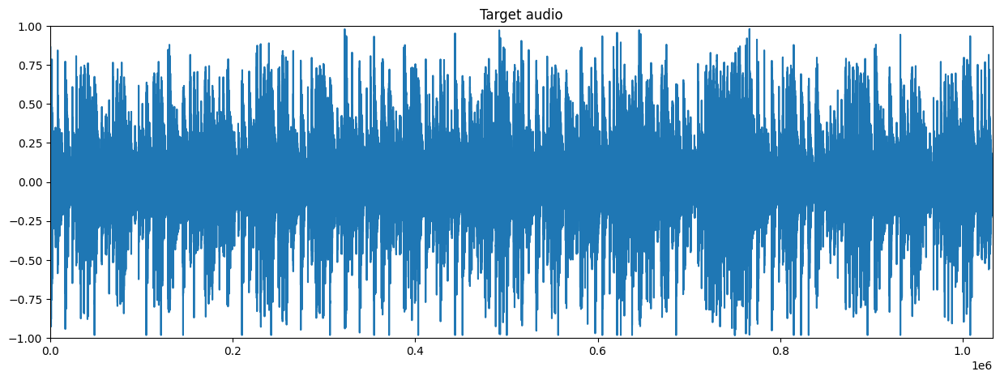

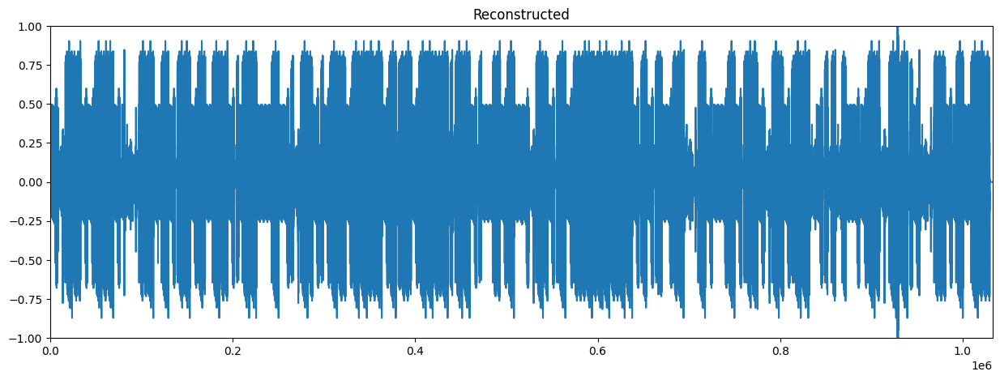

Target audio


Reconstructed


Mix of both signals


In [20]:
# Show further results of the reconstruction

# Plot waveforms
plt.figure(figsize=(15,5))
plt.plot(target_audio)
plt.axis([0, len(target_audio), -1, 1])
plt.title('Target audio')
plt.show()

plt.figure(figsize=(15,5))
plt.plot(generated_audio)
plt.axis([0, len(target_audio), -1, 1])
plt.title('Reconstructed')
plt.show()

# Show audio players
print('Target audio')
display(Audio(target_audio, rate=44100))

print('Reconstructed')
display(Audio(generated_audio, rate=44100))

print('Mix of both signals')
display(Audio(generated_audio * 0.5 + target_audio * 0.5, rate=44100))

# 2. Piano Audio Mosaicing / Reconstruction

In [30]:
target_frame

freesound_id                                        NaN
id                                             None_f39
path             486472__tkky__piano-chopped-edited.wav
start_sample                                    1133056
end_sample                                      1154560
loudness                                       0.001402
mfcc_0                                       -1068.4044
mfcc_1                                        233.69467
mfcc_2                                        129.41919
mfcc_3                                        26.720352
mfcc_4                                       -27.630032
mfcc_5                                       -31.056694
mfcc_6                                       -13.777824
mfcc_7                                        -4.723991
mfcc_8                                        -9.593208
mfcc_9                                       -16.512604
mfcc_10                                      -15.097771
mfcc_11                                       -6

In [29]:
# Do the reconstruction (audio mosaicing) of the target file using audio chunks (units, frames) from the sounds in the source collection

# Load target audio file to get its total length and to use it later
target_sound_filename = df_target_piano.iloc[0]['path']
target_audio = estd.MonoLoader(filename=target_sound_filename)()
total_length_target_audio = len(target_audio)

# Init array where to put the audio of the reconstructed file
generated_audio = np.zeros(total_length_target_audio)

# Init list where to store IDs of sounds used in the reconstruction
selected_freesound_ids = []

# Iterate over the analyzed frame of the target file
print('Reconstructing audio file...')
print(len(df_target_piano))
for i in range(0, len(df_target_piano)):
    target_frame = df_target_piano.iloc[i]  # Get current frame
    
    # Choose one frame from the source collection to replace the target frame - melodic flag set to consider pitch
    most_similar_frame = chose_frame_from_source_collection(target_frame, df_source_piano, True)
    #print(most_similar_frame)
    
    # Store freesound ID of the original sound where the 'most_similar_frame' belongs to
    selected_freesound_ids.append(most_similar_frame['freesound_id'])
    #print(most_similar_frame)
    
    # Get the audio segment corresponding to the 'most_similar_frame'
    target_frame_n_samples = target_frame['end_sample'] - target_frame['start_sample']
    most_similar_frame_audio = get_audio_file_segment(most_similar_frame['path'], most_similar_frame['start_sample'], target_frame_n_samples)
    
    # Add audio segment to the reconstructed audio array
    generated_audio[target_frame['start_sample']:target_frame['start_sample']+len(most_similar_frame_audio)] = most_similar_frame_audio
  
# Store the results in a WAV file
generated_audio_filename = '{0}.reconstructed.wav'.format(target_sound_filename)
estd.MonoWriter(filename=generated_audio_filename, format='wav', sampleRate=44100)(essentia.array(generated_audio))
print('Audio generated and saved in {0}!\nIt contains audio from the following sounds:'.format(generated_audio_filename))
display(df_piano.loc[df_piano['freesound_id'].isin(selected_freesound_ids)])  # Show metadata for the Freesound sounds used in the reconstruction

Reconstructing audio file...
80
Audio generated and saved in 486472__tkky__piano-chopped-edited.wav.reconstructed.wav!
It contains audio from the following sounds:


[wav @ 0x7fab81509a00] Using AVStream.codec.time_base as a timebase hint to the muxer is deprecated. Set AVStream.time_base instead.


,name,username,license,tags,freesound_id,path
10,Roland JX-8P - Under rated - C2 (36C1-3VXO.aif),modularsamples,http://creativecommons.org/publicdomain/zero/1.0/,"['multisample', 'single-note', 'synthesizer', ...",309852,files/309852_2050105-hq.ogg
16,Roland JX-8P - Mod Pad - C2 (36C1-KLUO.aif),modularsamples,http://creativecommons.org/publicdomain/zero/1.0/,"['multisample', 'single-note', 'synthesizer', ...",308237,files/308237_2050105-hq.ogg
18,Logan's Run,drriquet,http://creativecommons.org/publicdomain/zero/1.0/,"['sci-fi', 'fx', 'ambient', 'space', 'analog',...",135144,files/135144_615581-hq.ogg
19,The Hitchhiker.wav,drriquet,http://creativecommons.org/publicdomain/zero/1.0/,"['Sci-Fi', 'UFO', 'FX', 'Weird', 'Analog', 'JX...",135166,files/135166_615581-hq.ogg
71,8 bit game loop 003 simple mix 1 short 120 bp...,josefpres,http://creativecommons.org/publicdomain/zero/1.0/,"['gamemusic', 'josepres', '8-bits', '8bit', 'l...",653713,files/653713_5674468-hq.ogg
77,JX8P sample.wav,kainen,http://creativecommons.org/publicdomain/zero/1.0/,"['j8-xp', 'roland', 'synth']",432208,files/432208_18718-hq.ogg
114,electric guitar melody #5,Garuda1982,https://creativecommons.org/licenses/by/4.0/,"['melancholic', 'slow', 'background', 'melodie...",669479,files/669479_2061858-hq.ogg


In [31]:
def plot_audio_onsets(audio_path, onsets, title):
    target_audio = estd.MonoLoader(filename=audio_path)()
    audio = target_audio
    
    plt.rcParams['figure.figsize'] = (15, 6) # set plot sizes to something larger than default
    plt.plot(audio) #plot first 3secs of audio
              
    # plotting first 3 seconds
    #onsets_filter =[i for i in onsets if i <= upper_b]
    for onset in onsets:
        plt.axvline(x=onset, color='red')

    plt.axis([0, len(target_audio), -1, 1])
    plt.title("Audio waveform and the estimated {} onset positions".format(title)) 
    plt.show()

def compute_onsets_hfc_complex(audio_path):
    target_audio = estd.MonoLoader(filename=audio_path)()
    audio = target_audio
    # Phase 1: compute the onset detection function
    # The OnsetDetection algorithm provides various onset detection functions. Let’s use two of them.
    od1 = OnsetDetection(method='hfc')
    od2 = OnsetDetection(method='complex')
    # Let’s also get the other algorithms we will need, and a pool to store the results
    w = Windowing(type = 'hann')
    fft = FFT() # this gives us a complex FFT
    c2p = CartesianToPolar() # and this turns it into a pair (magnitude, phase)
    pool = essentia.Pool()
    # Computing onset detection functions.
    for frame in FrameGenerator(audio, frameSize = 1024, hopSize = 512):
        mag, phase, = c2p(fft(w(frame)))
        pool.add('features.hfc', od1(mag, phase))
        pool.add('features.complex', od2(mag, phase))
    # Phase 2: compute the actual onsets locations
    onsets = Onsets()
    onsets_hfc = onsets(# this algo expects a matrix, not a vector
                        essentia.array([ pool['features.hfc'] ]),
                        # you need to specify weights, but as there is only a single
                        # function, it doesn’t actually matter which weight you give it
                        [ 1 ])
    onsets_complex = onsets(essentia.array([ pool['features.complex'] ]), [ 1 ])
    return onsets_hfc*44100, onsets_complex*44100

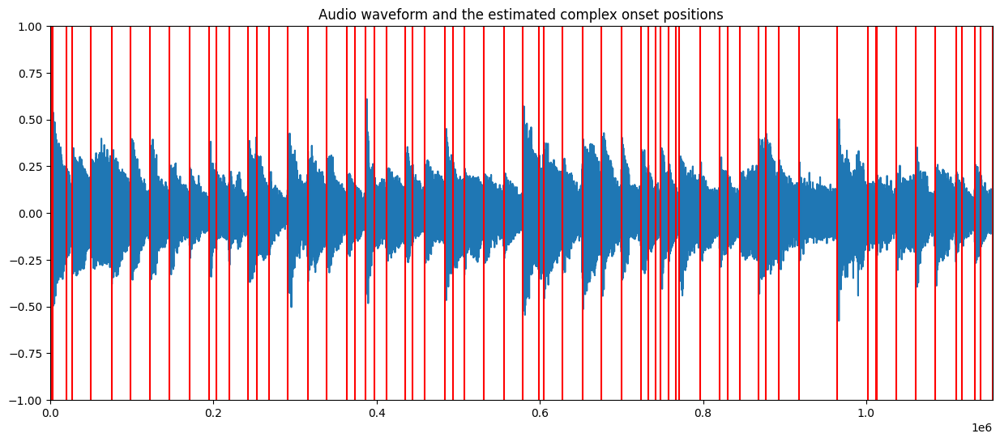

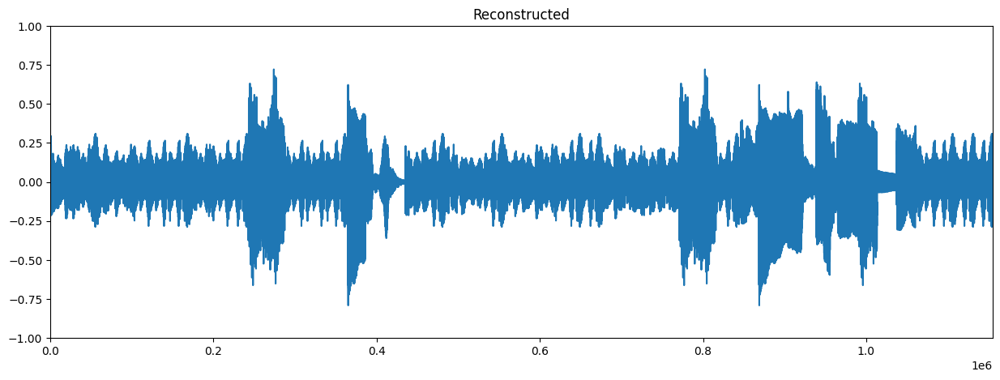

Target audio


Reconstructed


Mix of both signals


In [32]:
# Show further results of the reconstruction

# Plot waveforms
#plot target audii with path
target_sound_filename = df_target_piano.iloc[0]['path']
onsets_hfc, onsets_complex = compute_onsets_hfc_complex(target_sound_filename)
plot_audio_onsets(target_sound_filename, onsets_complex, 'complex')

plt.figure(figsize=(15,5))
plt.plot(generated_audio)
plt.axis([0, len(target_audio), -1, 1])
plt.title('Reconstructed')
plt.show()

# Show audio players
print('Target audio')
display(Audio(target_audio, rate=44100))

print('Reconstructed')
display(Audio(generated_audio, rate=44100))

print('Mix of both signals')
display(Audio(generated_audio * 0.5 + target_audio * 0.5, rate=44100))